# Импорт необходимых библиотек

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.image import imread
import cv2

### 1. Загрузка и отображение изображений

На первом этапе мы загружаем изображения из указанной папки с помощью `matplotlib.image.imread`.  
Изображение `original.png` будет использоваться в качестве эталонного (опорного), остальные изображения выравниваются относительно него.

Функция `show_images()` отображает два изображения рядом, чтобы можно было визуально оценить исходные данные.

📌 **Цель**: Загрузить изображения и убедиться в их корректности перед обработкой.


In [76]:
def show_images(im1, im2, title_1, title_2):
    plt.figure(figsize = (15, 8))
    plt.subplot(121)
    plt.imshow(im1)
    plt.axis("off")
    plt.title(title_1)

    plt.subplot(122)
    plt.imshow(im2)
    plt.axis("off")
    plt.title(title_2)
    plt.show()

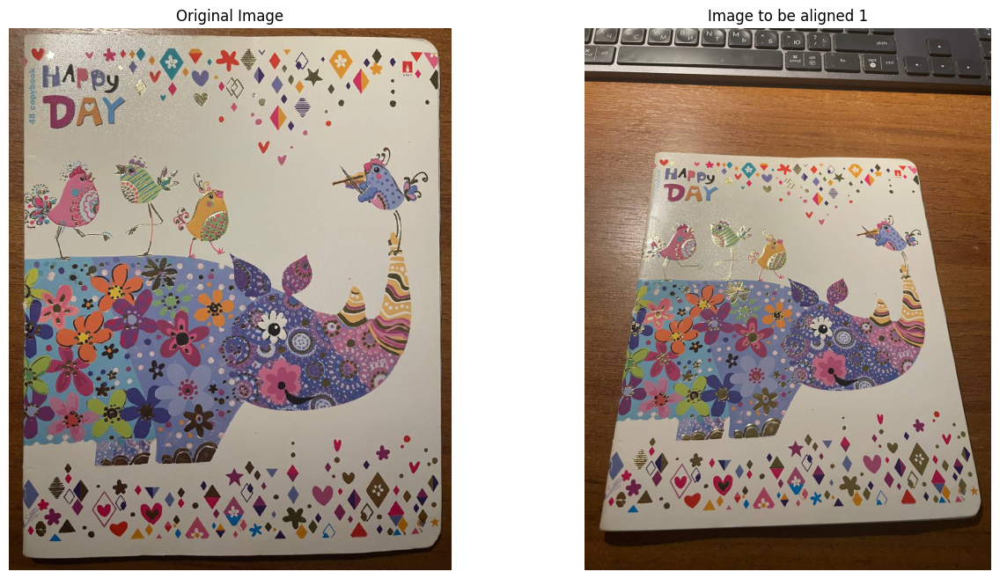

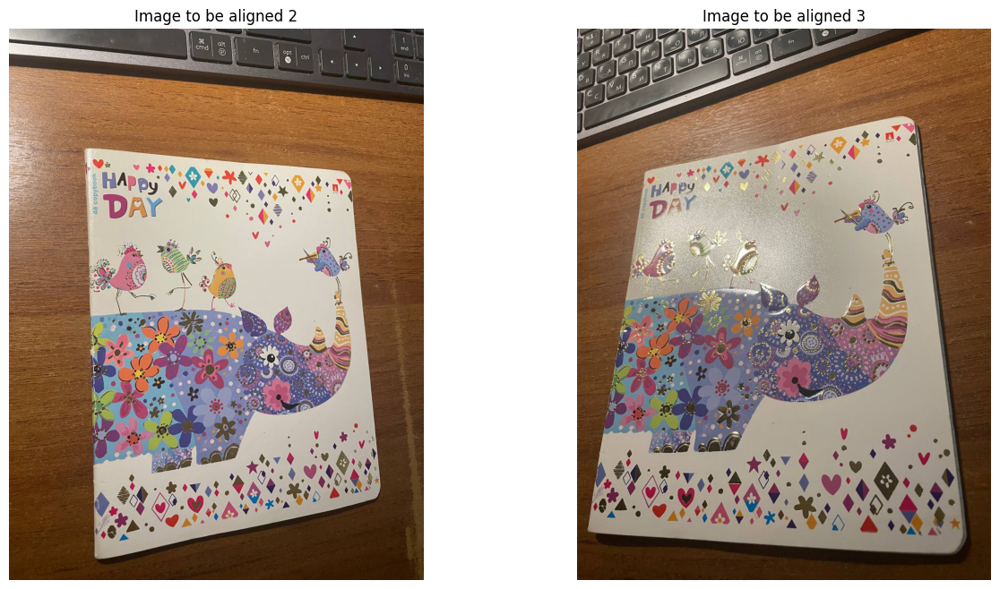

In [77]:
# Read images
image_1 = imread("images2/original.png")
image_2 = imread("images2/image1.png")
image_3 = imread("images2/image2.png")
image_4 = imread("images2/image3.png")

# Show images
show_images(image_1, image_2, "Original Image", "Image to be aligned 1")
show_images(image_3, image_4, "Image to be aligned 2", "Image to be aligned 3")

### 🎯 2. Детектирование ключевых точек методом Харриса

На этом этапе применяется алгоритм **Harris Corner Detection** для обнаружения углов и ключевых точек в изображениях.

- `harris_corners()` вычисляет отклик Харриса (Harris response) для каждого пикселя.
- `get_keypoints()` выбирает точки с наибольшими значениями отклика.
- `plot_image_with_ketpoints()` визуализирует найденные ключевые точки на изображениях.

📌 **Цель**: Найти и отобразить значимые ключевые точки для последующего сопоставления.


### 📐 Метод Харриса — основные формулы

1. Вычисляем градиенты:
$$
I_x = \frac{\partial I}{\partial x}, \quad I_y = \frac{\partial I}{\partial y}
$$

2. Строим матрицу M на каждом пикселе:
$$
M = \sum \begin{bmatrix}
I_x^2 & I_x I_y \\
I_x I_y & I_y^2
\end{bmatrix}
$$

3. Отклик Харриса:
$$
R = \det(M) - k \cdot (\text{trace}(M))^2
$$

📌 Если \( R \) велик — найден угол (ключевая точка).



In [78]:
def harris_corners(img, window_size = 3, k = 0.04):
    H, W, C = img.shape
    # Calculation gradient for each channel
    Ix = np.zeros_like(img)
    Iy = np.zeros_like(img)
    for c in range(C):
        Iy[:, :, c], Ix[:, :, c] = np.gradient(img[:, :, c])
    
    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    Ixx_sum = Ixx.sum(axis = 2)
    Iyy_sum = Iyy.sum(axis = 2)
    Ixy_sum = Ixy.sum(axis = 2)

    # Calculation Harrris
    R = np.zeros((H, W), dtype = np.float32)
    offset = window_size // 2
    for y in range(offset, H - offset):
        for x in range(offset, W - offset):
            Sxx = Ixx_sum[y - offset: y + offset + 1, x - offset:x + offset + 1].sum()
            Syy = Iyy_sum[y - offset: y + offset + 1, x - offset:x + offset + 1].sum()
            Sxy = Ixy_sum[y - offset: y + offset + 1, x - offset:x + offset + 1].sum()
            det = Sxx * Syy - Sxy * Sxy
            trace = Sxx + Syy
            R[y, x] = det - k * (trace**2)
    return R

In [79]:
def get_keypoints(R, threshold_ratio = 0.01, max_points = 500):
    threshold = R.max() * threshold_ratio
    coords = np.argwhere(R > threshold)
    responses = R[coords[:, 0] , coords[:, 1]]

    indices = np.argsort(-responses)
    coords = coords[indices]
    return coords[:max_points]

def plot_keypoints(img, keypoints, title):
    plt.imshow(img)
    plt.scatter(keypoints[:, 1], keypoints[:, 0], marker = 'o', facecolors='none', color= 'lime')
    plt.axis('off')
    plt.title(title)

In [80]:
def plot_image_with_ketpoints(img1, img2, keypoints1, keypoints2):
    plt.figure(figsize = (15, 8))
    plt.subplot(121)
    plot_keypoints(img1, keypoints1, "Original image with Key points")
    plt.subplot(122)
    plot_keypoints(img2, keypoints2, "Image to be aliged with Key points")

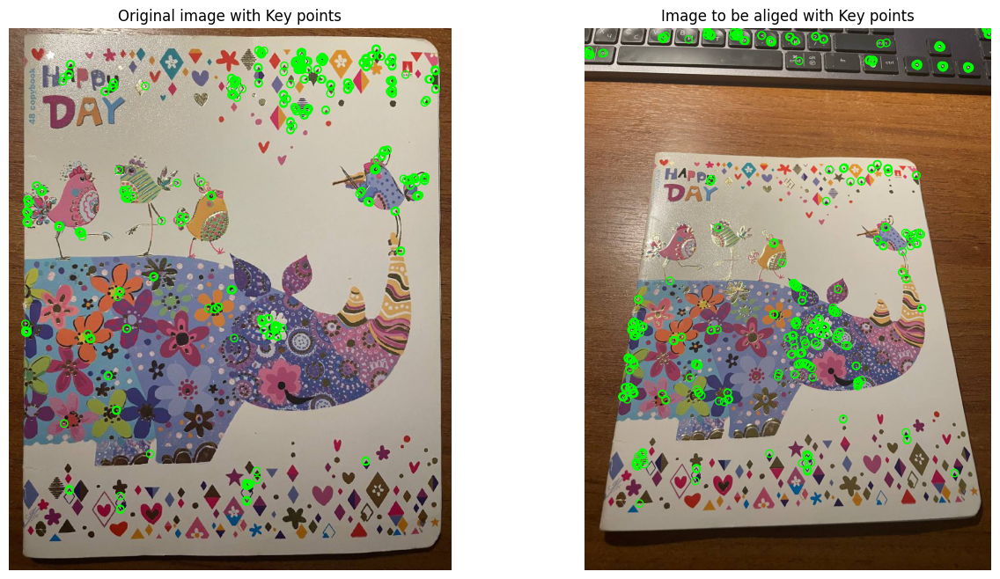

In [81]:
# Get haris corners of images
R1 = harris_corners(image_1)
R2 = harris_corners(image_2)
R3 = harris_corners(image_3)
R4 = harris_corners(image_4)

# Get key points of images
keypoints1 = get_keypoints(R1)
keypoints2 = get_keypoints(R2)
keypoints3 = get_keypoints(R3)
keypoints4 = get_keypoints(R4)

# Plot images with keypoints
plot_image_with_ketpoints(image_1, image_2, keypoints1, keypoints2)

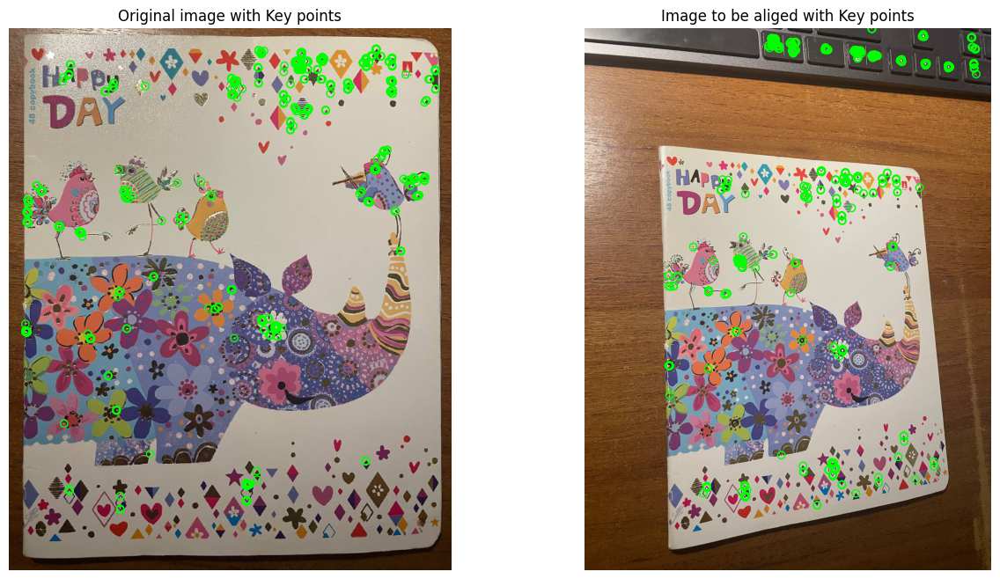

In [82]:
plot_image_with_ketpoints(image_1, image_3, keypoints1, keypoints3)

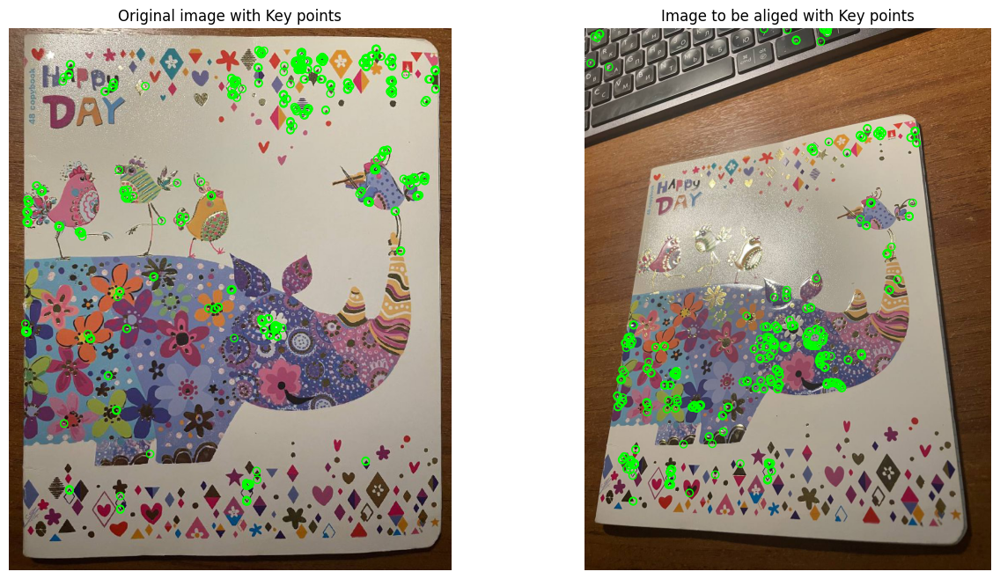

In [83]:
plot_image_with_ketpoints(image_1, image_4, keypoints1, keypoints4)

### 3. Извлечение дескрипторов ключевых точек

После определения ключевых точек необходимо извлечь их дескрипторы — числовое представление окружения каждой точки.

- Функция `extract_descriptor()` вырезает небольшой фрагмент изображения вокруг каждой точки и преобразует его в вектор.
- Эти дескрипторы будут использоваться для сравнения и сопоставления точек между изображениями.

📌 **Цель**: Представить ключевые точки в виде векторов для их сопоставления.


In [84]:
def extract_descriptor(img, keypoints, patch_size = 9):
    '''Extract a descriptor for each keypoint from an RGB image, by taking 
    a small patch around that point and converting it into a 1D vector.'''
    descriptors = []
    half_size = patch_size // 2
    H, W, C = img.shape

    padded = np.pad(img, ((half_size, half_size), (half_size, half_size), (0, 0)), mode = 'constant')

    for y, x in keypoints:
        patch = padded[y:y+patch_size, x:x+patch_size]
        descriptors.append(patch.flatten())
    return np.array(descriptors)
    

### 4. Сопоставление дескрипторов между изображениями

Теперь мы ищем соответствия между ключевыми точками двух изображений, сравнивая их дескрипторы.

- `match_descriptors()` использует метрику SSD (сумма квадратов разностей) для поиска наиболее близких пар.
- `get_good_matches()` выбирает наилучшие N совпадений.
- `draw_matches()` визуализирует найденные пары ключевых точек на изображениях.

📌 **Цель**: Найти соответствующие пары точек между изображениями.


In [85]:
def match_descriptors(desc1, desc2):
    matches = []
    for i, d1 in enumerate(desc1):
        ssd = np.sum((desc2 - d1) ** 2, axis = 1)
        j = np.argmin(ssd)
        matches.append((i, j, ssd[j]))
    # Sort by descending of ssd
    matches = sorted(matches, key = lambda x: x[2])
    return matches 

In [ ]:
def draw_matches(img1, img2, kp1, kp2, matches):
    h1, w1, _ = img1.shape
    h2, w2, _ = img2.shape

    # Resize img2 về cùng chiều cao với img1 (giữ tỷ lệ khung hình)
    if h1 != h2:
        scale = h1 / h2
        img2 = cv2.resize(img2, (int(w2 * scale), h1))
        kp2 = [(y * scale, x * scale) for (y, x) in kp2]  # scale keypoints tương ứng

    h2, w2, _ = img2.shape  # cập nhật lại kích thước sau resize
    new_img = np.zeros((h1, w1 + w2, 3), dtype=img1.dtype)
    new_img[:h1, :w1, :] = img1
    new_img[:h1, w1:w1 + w2, :] = img2

    plt.figure(figsize=(15, 8))
    plt.imshow(new_img)
    for m in matches:
        i, j, _ = m
        y1, x1 = kp1[i]
        y2, x2 = kp2[j]
        plt.plot([x1, x2 + w1], [y1, y2], color='lime', linestyle='--', linewidth=1)
        plt.scatter(x1, y1, marker='o', color='cyan', s=30)
        plt.scatter(x2 + w1, y2, marker='o', color='magenta', s=30)
    plt.axis('off')
    plt.title('Matches')
    plt.show()


In [87]:
def get_good_matches(img1, img2, keypoints1, keypoints2):
    # Get descriptors of images
    descriptors1 = extract_descriptor(img1, keypoints1)
    descriptors2 = extract_descriptor(img2, keypoints2)

    # Match descriptors of images
    matches = match_descriptors(descriptors1, descriptors2)
    num_good = min(200, len(matches))
    good_matches = matches[:num_good]

    return good_matches

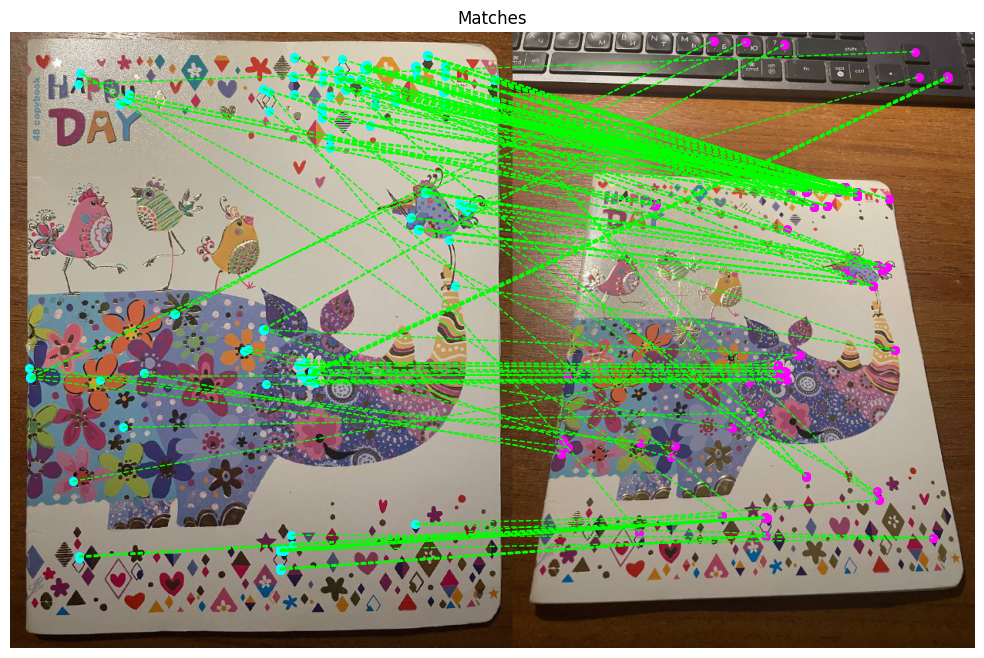

In [89]:
good_matches_12 = get_good_matches(image_1, image_2, keypoints1, keypoints2)
draw_matches(image_1, image_2, keypoints1, keypoints2, good_matches_12)

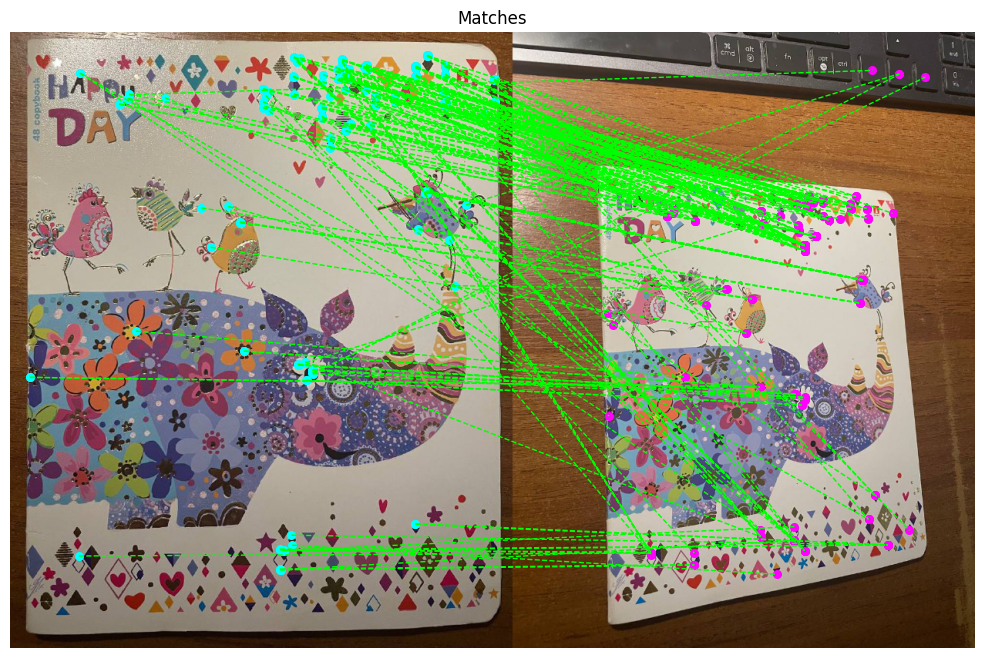

In [90]:
good_matches_13 = get_good_matches(image_1, image_3, keypoints1, keypoints3)
draw_matches(image_1, image_3, keypoints1, keypoints3, good_matches_13)

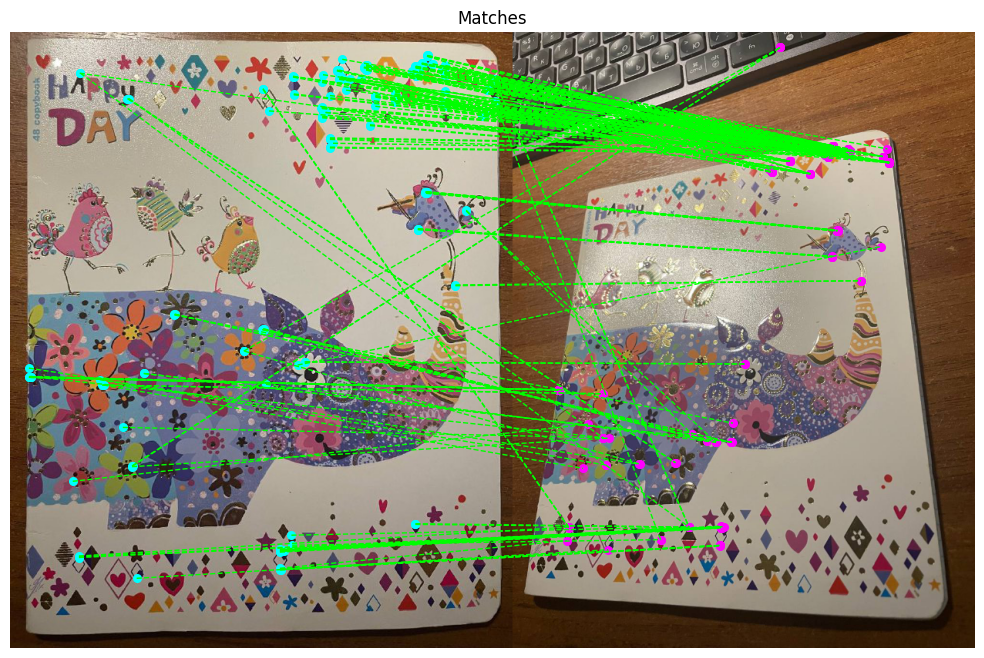

In [91]:
good_matches_14 = get_good_matches(image_1, image_4, keypoints1, keypoints4)
draw_matches(image_1, image_4, keypoints1, keypoints4, good_matches_14)

### 🧠 5. Оценка гомографии с помощью RANSAC

С помощью найденных пар точек можно вычислить матрицу гомографии — преобразование, выравнивающее одно изображение по другому.

- `compute_homography()` рассчитывает гомографию на основе 4 пар точек.
- `ransac_homography()` применяет RANSAC для устойчивости к выбросам (outliers) и выбирает наилучшую гомографию по количеству инлайеров.

📌 **Цель**: Оценить точное геометрическое преобразование между изображениями.


### 🔄 Гомография и RANSAC

**Гомография (3x3)** — преобразование между двумя плоскостями:

$$
\begin{bmatrix}
x' \\
y' \\
w'
\end{bmatrix}
=
H \cdot
\begin{bmatrix}
x \\
y \\
1
\end{bmatrix}
$$

Решается через SVD с построением линейной системы:

$$
A \cdot h = 0
$$

**RANSAC**:
- Случайно выбираем 4 пары точек.
- Строим H.
- Считаем расстояние между трансформированной точкой и целевой.
- Считаем инлайеры (расстояние < порога).
- Повторяем и выбираем модель с наибольшим числом инлайеров.

📌 Устойчива к выбросам и шуму.


In [92]:
def compute_homography(pts_src, pts_dst):
    N = pts_src.shape[0]
    A = []
    for i in range(N):
        x, y = pts_src[i, 0], pts_src[i, 1]
        u, v = pts_dst[i, 0], pts_dst[i, 1]
        A.append([-x, -y, -1,  0,  0,  0,  u*x,  u*y,  u])
        A.append([ 0,  0,  0, -x, -y, -1,  v*x,  v*y,  v])
    A = np.array(A)
    U, S, Vt = np.linalg.svd(A)
    h = Vt[-1, :]
    H = h.reshape(3, 3)
    # Tránh chia 0
    if abs(H[2,2]) < 1e-12:
        return None
    return H / H[2, 2]

In [93]:
def ransac_homography(pts_src, pts_dst, iterations=1000, threshold=5):
    best_H = None
    max_inliers = 0
    best_inliers = None
    N = pts_src.shape[0]
    if N < 4:
        return None, None
    
    for _ in range(iterations):
        idx = np.random.choice(N, 4, replace=False)
        H = compute_homography(pts_src[idx], pts_dst[idx])
        if H is None:
            continue
        
        pts_src_h = np.concatenate([pts_src, np.ones((N, 1))], axis=1)
        pts_trans = (H @ pts_src_h.T).T
        z = pts_trans[:, 2]
        
        valid = np.abs(z) > 1e-12
        x_est = np.zeros(N)
        y_est = np.zeros(N)
        x_est[valid] = pts_trans[valid, 0] / z[valid]
        y_est[valid] = pts_trans[valid, 1] / z[valid]
        
        dx = pts_dst[:, 0] - x_est
        dy = pts_dst[:, 1] - y_est
        dist = np.sqrt(dx*dx + dy*dy)
        dist[~valid] = 1e10
        
        inliers = dist < threshold
        count = np.sum(inliers)
        if count > max_inliers:
            max_inliers = count
            best_H = H
            best_inliers = inliers
    
    if best_inliers is not None and np.sum(best_inliers) >= 4:
        refine_H = compute_homography(pts_src[best_inliers], pts_dst[best_inliers])
        if refine_H is not None:
            best_H = refine_H
    return best_H, best_inliers

In [94]:
pts1_12 = np.array([keypoints1[i] for i, j, _ in good_matches_12])[:, ::-1]  # (x,y)
pts2 = np.array([keypoints2[j] for i, j, _ in good_matches_12])[:, ::-1]
pts1_13 = np.array([keypoints1[i] for i, j, _ in good_matches_13])[:, ::-1] 
pts3 = np.array([keypoints3[j] for i, j, _ in good_matches_13])[:, ::-1] 
pts1_14 = np.array([keypoints1[i] for i, j, _ in good_matches_14])[:, ::-1] 
pts4 = np.array([keypoints4[j] for i, j, _ in good_matches_14])[:, ::-1] 

In [95]:
H_12, inliers_2 = ransac_homography(pts2, pts1_12, iterations=1000, threshold=5)
H_13, inliers_3 = ransac_homography(pts3, pts1_13, iterations=1000, threshold=5)
H_14, inliers_4 = ransac_homography(pts4, pts1_14, iterations=1000, threshold=5)

### 6. Перспективное преобразование и выравнивание изображений

Имея матрицу гомографии, можно преобразовать изображение таким образом, чтобы оно стало выровненным относительно опорного.

- `warp_perspective()` реализует обратное проецирование (inverse warping) с ближайшим соседом.
- Результат — изображение, которое совмещается с оригиналом по перспективе.

📌 **Цель**: Преобразовать изображение по матрице гомографии.


### 🔁 Перспективное преобразование (Warping)

- Создаем сетку выходных координат \( (x', y') \).
- Вычисляем обратное преобразование:
$$
\begin{bmatrix}
x \\
y \\
w
\end{bmatrix}
= H^{-1} \cdot
\begin{bmatrix}
x' \\
y' \\
1
\end{bmatrix}
$$

- Делим на \( w \), округляем до ближайшего целого — метод ближайшего соседа.

📌 Проверяем выход за границы и деление на ноль.


In [98]:
def warp_perspective(img, H, output_shape):
    h_out, w_out = output_shape
    H_inv = np.linalg.inv(H)
    
    # Tạo lưới toạ độ ảnh đích
    xx, yy = np.meshgrid(np.arange(w_out), np.arange(h_out))
    grid = np.stack([xx.ravel(), yy.ravel(), np.ones_like(xx.ravel())], axis=0)  # (3, N)
    
    # Chiếu ngược về ảnh gốc
    src_coords = H_inv @ grid  # (3, N)
    z = src_coords[2, :]
    valid = np.abs(z) > 1e-12
    
    x_src = np.zeros_like(z)
    y_src = np.zeros_like(z)
    x_src[valid] = src_coords[0, valid] / z[valid]
    y_src[valid] = src_coords[1, valid] / z[valid]
    
    # Nearest neighbor (có thể đổi sang bilinear nếu muốn)
    x_nn = np.round(x_src).astype(int)
    y_nn = np.round(y_src).astype(int)
    
    H_in, W_in, C_in = img.shape
    warped = np.zeros((h_out, w_out, C_in), dtype=img.dtype)
    
    # Gán pixel
    for idx in range(w_out * h_out):
        if valid[idx]:
            xx_i = idx % w_out
            yy_i = idx // w_out
            xg = x_nn[idx]
            yg = y_nn[idx]
            if 0 <= xg < W_in and 0 <= yg < H_in:
                warped[yy_i, xx_i, :] = img[yg, xg, :]
    return warped


In [99]:
h, w, c = image_1.shape
im2_reg = warp_perspective(image_2, H_12, (h, w))
im3_reg = warp_perspective(image_3, H_13, (h, w))
im4_reg = warp_perspective(image_4, H_14, (h, w))

### 7. Отображение результата после выравнивания

Финальный этап — сравнение оригинального и преобразованного изображений.  
С помощью `show_images()` можно визуально проверить качество выравнивания.

📌 **Цель**: Визуализировать результат и убедиться в корректности выравнивания.


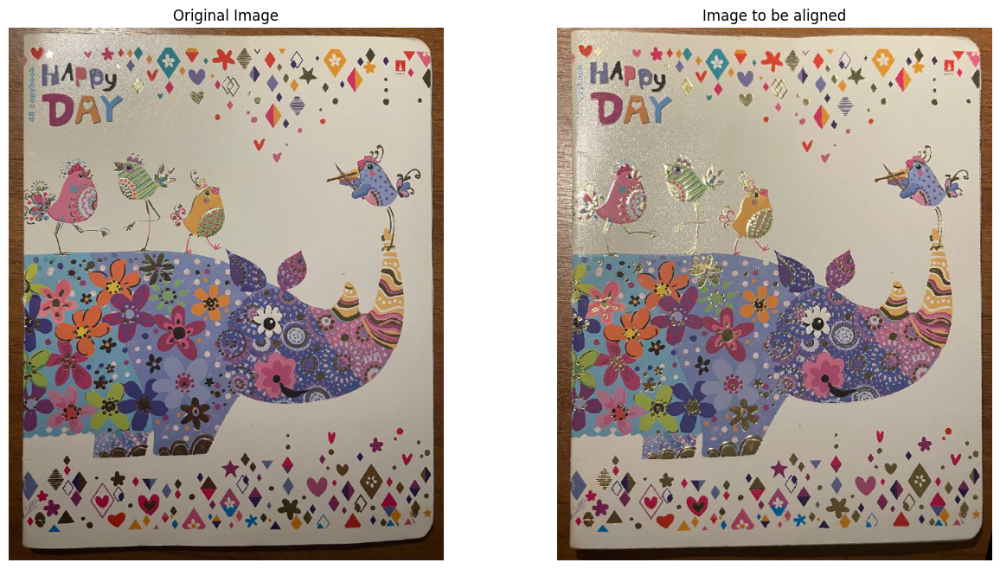

In [102]:
show_images(image_1, im2_reg, "Original Image", "Image to be aligned")

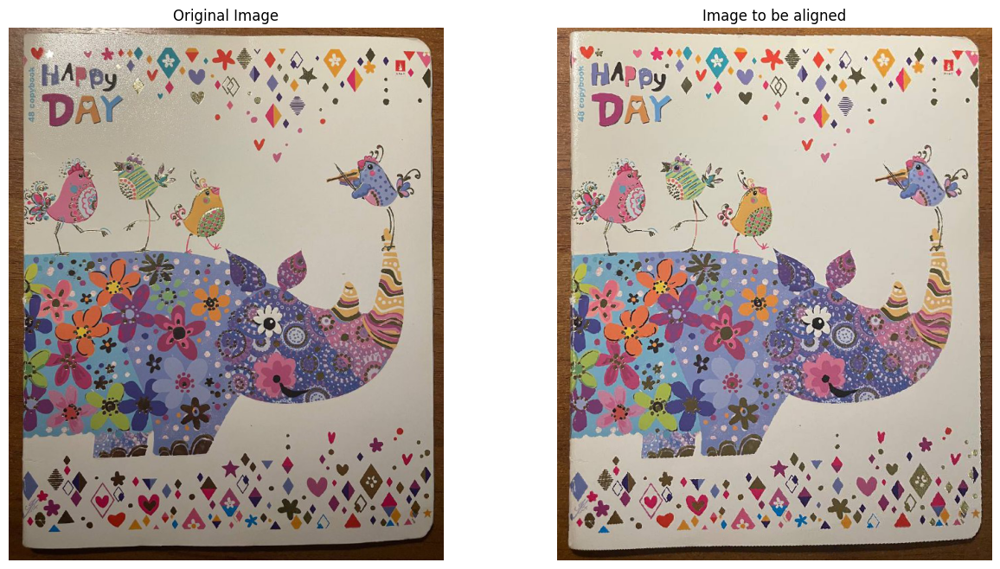

In [103]:
show_images(image_1, im3_reg, "Original Image", "Image to be aligned")

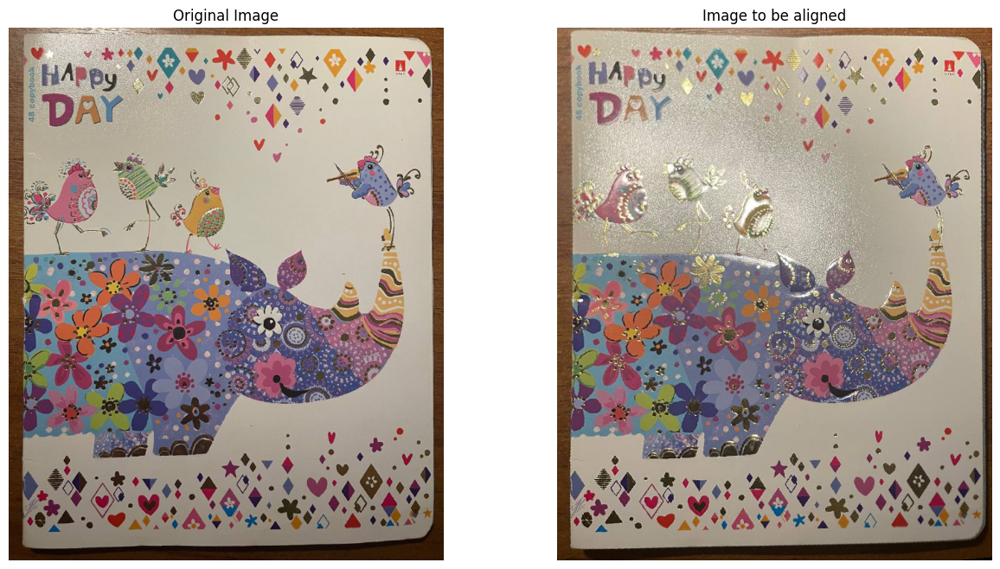

In [104]:
show_images(image_1, im4_reg, "Original Image", "Image to be aligned")